<a href="https://colab.research.google.com/github/anand176/JackFruit__Ripeness-Detection-System/blob/master/ResNet50.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from sklearn.model_selection import train_test_split

In [3]:
import os
labels=[]
file_names=os.listdir('/content/drive/MyDrive/resized')
print(file_names)
for file in file_names:
    if file[0]=='r':

        labels.append(1)
    else:

        labels.append(0)


['ripe_0_1333.jpeg', 'ripe_0_1278.jpeg', 'ripe_0_1901.jpeg', 'ripe_0_1572.jpeg', 'ripe_0_1284.jpeg', 'ripe_0_1886.jpeg', 'ripe_0_1235.jpeg', 'ripe_0_1708.jpeg', 'ripe_0_1302.jpeg', 'ripe_0_1111.jpeg', 'ripe_0_1037.jpeg', 'ripe_0_1976.jpeg', 'ripe_0_1044.jpeg', 'ripe_0_1000.jpeg', 'ripe_0_2008.jpeg', 'ripe_0_1649.jpeg', 'ripe_0_1827.jpeg', 'ripe_0_1378.jpeg', 'ripe_0_1918.jpeg', 'ripe_0_1010.jpeg', 'ripe_0_1528.jpeg', 'ripe_0_1920.jpeg', 'ripe_0_1943.jpeg', 'ripe_0_1306.jpeg', 'ripe_0_2211.jpeg', 'ripe_0_1140.jpeg', 'ripe_0_117.jpeg', 'ripe_0_1339.jpeg', 'ripe_0_1975.jpeg', 'ripe_0_1630.jpeg', 'ripe_0_1752.jpeg', 'ripe_0_1567.jpeg', 'ripe_0_219.jpeg', 'ripe_0_1562.jpeg', 'ripe_0_1966.jpeg', 'ripe_0_1279.jpeg', 'ripe_0_1551.jpeg', 'ripe_0_1713.jpeg', 'ripe_0_2101.jpeg', 'ripe_0_1845.jpeg', 'ripe_0_206.jpeg', 'ripe_0_1755.jpeg', 'ripe_0_1162.jpeg', 'ripe_0_1351.jpeg', 'ripe_0_1523.jpeg', 'ripe_0_1928.jpeg', 'ripe_0_1961.jpeg', 'ripe_0_1370.jpeg', 'ripe_0_1536.jpeg', 'ripe_0_1895.jpeg', 'r

In [4]:
import cv2
import glob
image_directory='/content/drive/MyDrive/resized/'
image_extension=['png','jpg']
files=[]
# matching_files = glob.glob(directory + '*.jpg')
print(files)
[files.extend(glob.glob(image_directory+'*.jpeg'))]
images_array=np.asarray([cv2.imread(file) for file in files])
print(type(images_array))
# print(images_array)
print(images_array.shape)

[]
<class 'numpy.ndarray'>
(904, 224, 224, 3)


In [5]:
X=images_array
Y=np.asarray(labels)

In [6]:
X_train,X_test,Y_train,Y_test=train_test_split(X,Y,test_size=0.2,random_state=2)

In [7]:
X_train_scaled=X_train/255
X_test_scaled=X_test/255

In [8]:
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Flatten, BatchNormalization, GlobalAveragePooling2D


base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))


for layer in base_model.layers:
    layer.trainable = False


model = Sequential()

model.add(base_model)


model.add(GlobalAveragePooling2D())
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(1, activation='sigmoid'))


model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])



94765736/94765736 [==============================] - 1s 0us/step


In [9]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 global_average_pooling2d (  (None, 2048)              0         
 GlobalAveragePooling2D)                                         
                                                                 
 dense (Dense)               (None, 128)               262272    
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                                 
 dense_1 (Dense)             (None, 1)                 129       
                                                                 
Total params: 23850113 (90.98 MB)
Trainable params: 262401 (1.00 MB)
Non-trainable params: 23587712 (89.98 MB)
___________

In [10]:
model.compile(optimizer='adam',loss='binary_crossentropy',metrics=['accuracy'])
# model.compile(
#     optimizer='adam',
#     loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
#     metrics=['acc']

# )

In [11]:
model.fit(X_train_scaled,Y_train,epochs=20)

Epoch 1/20
23/23 [==============================] - 179s 7s/step - loss: 0.8127 - accuracy: 0.4896
Epoch 2/20
23/23 [==============================] - 159s 7s/step - loss: 0.7136 - accuracy: 0.5242
Epoch 3/20
23/23 [==============================] - 160s 7s/step - loss: 0.6880 - accuracy: 0.5367
Epoch 4/20
23/23 [==============================] - 163s 7s/step - loss: 0.6864 - accuracy: 0.5505
Epoch 5/20
23/23 [==============================] - 168s 7s/step - loss: 0.6825 - accuracy: 0.5629
Epoch 6/20
23/23 [==============================] - 161s 7s/step - loss: 0.6826 - accuracy: 0.5422
Epoch 7/20
23/23 [==============================] - 160s 7s/step - loss: 0.6775 - accuracy: 0.5615
Epoch 8/20
23/23 [==============================] - 161s 7s/step - loss: 0.6830 - accuracy: 0.5698
Epoch 9/20
23/23 [==============================] - 163s 7s/step - loss: 0.6770 - accuracy: 0.5698
Epoch 10/20
23/23 [==============================] - 158s 7s/step - loss: 0.6708 - accuracy: 0.6044
Epoch 11/

In [12]:
score,acc=model.evaluate(X_test_scaled,Y_test)
print('test loss=',score)
print('test accuracy=',acc)

6/6 [==============================] - 40s 6s/step - loss: 0.6509 - accuracy: 0.6188
test loss= 0.6508628726005554
test accuracy= 0.6187845468521118


In [13]:
score,acc=model.evaluate(X_train_scaled,Y_train)
print('test loss=',score)
print('test accuracy=',acc)

23/23 [==============================] - 167s 7s/step - loss: 0.6609 - accuracy: 0.5906
test loss= 0.660944938659668
test accuracy= 0.5905947685241699


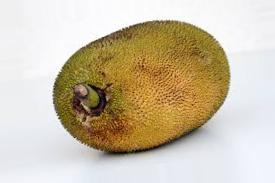

In [15]:
from google.colab.patches import cv2_imshow
import cv2

# Attempt to read the image
input_image = cv2.imread('/content/ripe_0_33.jpeg')

# Check if image reading was successful
if input_image is not None:
    # Display the image
    cv2_imshow(input_image)
else:
    print("Failed to read the image file. Please check the file path and format.")

path of img to be predicted:/content/ripe_0_33.jpeg


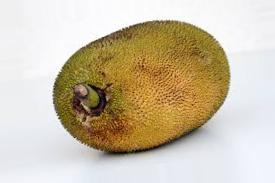

1/1 [==============================] - 0s 206ms/step
[[0.48720473]]
0.48720473
ripe


In [17]:
input_image_path=input('path of img to be predicted:')
input_image=cv2.imread(input_image_path)
cv2_imshow(input_image)
input_image_resize=cv2.resize(input_image,(224,224))
# print(input_image_resize)
input_image_scaled=input_image_resize/255
image_reshaped=np.reshape(input_image_scaled,[1,224,224,3])
input_prediction=model.predict(image_reshaped)
# input_pred_label=np.argmax(input_prediction)
# print(input_pred_label)
print(input_prediction)
print(input_prediction[0][0])
if input_prediction[0][0]>.4:
  # .59 is just the approx value
  print('ripe')
else:
  print('unripe')

path of img to be predicted:/content/IMG_20200129_101411.jpg


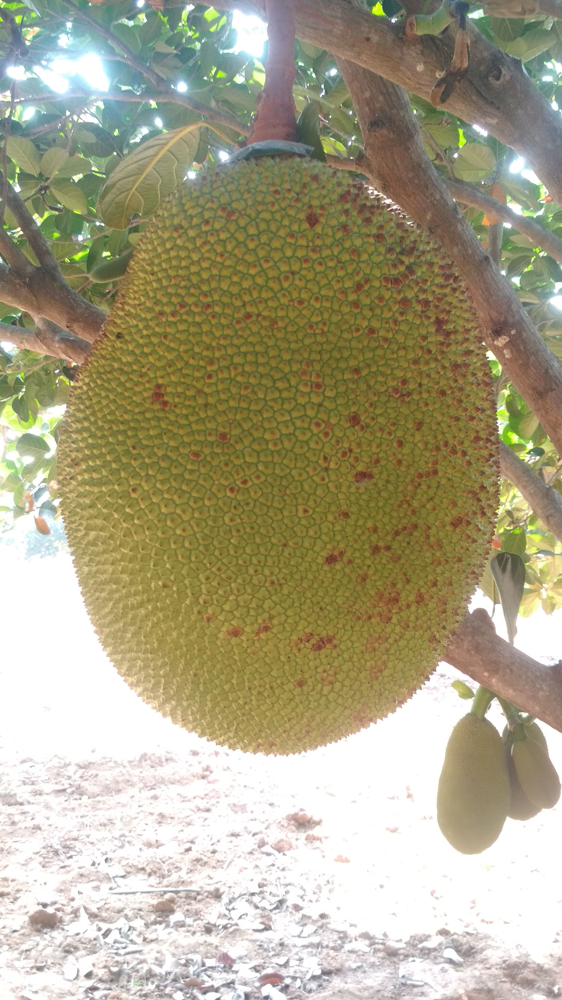

1/1 [==============================] - 0s 385ms/step
[[0.47145185]]
0.47145185
unripe


In [19]:
input_image_path=input('path of img to be predicted:')
input_image=cv2.imread(input_image_path)
cv2_imshow(input_image)
input_image_resize=cv2.resize(input_image,(224,224))
# print(input_image_resize)
input_image_scaled=input_image_resize/255
image_reshaped=np.reshape(input_image_scaled,[1,224,224,3])
input_prediction=model.predict(image_reshaped)
# input_pred_label=np.argmax(input_prediction)
# print(input_pred_label)
print(input_prediction)
print(input_prediction[0][0])
if input_prediction[0][0]>.48:
  # .59 is just the approx value
  print('ripe')
else:
  print('unripe')


In [20]:
model.save('res_model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
